# Анализ датасета - электронные заказы на амазон 

<h1 id="tocheading">Содержание</h1>
<div id="toc"></div>

In [179]:
import ipywidgets as widgets
from IPython.display import display, HTML
import ipywidgets as widgets
from IPython.display import display, HTML
javascript_functions = {False: "hide()", True: "show()"}
button_descriptions  = {False: "Показать код", True: "Скрыть код"}
def toggle_code(state):
    output_string = "<script>$(\"div.input\").{}</script>"
    output_args   = (javascript_functions[state],)
    output        = output_string.format(*output_args)
    display(HTML(output))
def button_action(value):
    state = value.new
    toggle_code(state)
    value.owner.description = button_descriptions[state]
state = False
toggle_code(state)
button = widgets.ToggleButton(state, description = button_descriptions[state])
button.observe(button_action, "value")
display(button)

ToggleButton(value=False, description='Показать код')

### Предварительная обработка данных
___
#### Чтение и фильтрация данных


Импортируем необходимые библиотеки для обработки данных. 
Предварительно нам известно, что это данные электронной коммерции Амазон. Посмотрим первый раз на наши данные.

In [149]:
import numpy as np 
import pandas as pd 
import re
import warnings
warnings.filterwarnings('ignore')
data = "./amazon_co-ecommerce_sample.csv"
corpus = pd.read_csv(data)
corpus.describe

<bound method NDFrame.describe of       index                           uniq_id  \
0         0  eac7efa5dbd3d667f26eb3d3ab504464   
1         1  b17540ef7e86e461d37f3ae58b7b72ac   
2         2  348f344247b0c1a935b1223072ef9d8a   
3         3  e12b92dbb8eaee78b22965d2a9bbbd9f   
4         4  e33a9adeed5f36840ccc227db4682a36   
...     ...                               ...   
9995   9995  44d6967f083825a5de36ad4865a65bcd   
9996   9996  08f0747b6fc6687215ffb994c3a6fb32   
9997   9997  bf6cc073f8f24e6e338190fa16f6ee9d   
9998   9998  cd783d0b8b44e631b9788b203eaaefae   
9999   9999  94d18e86e504bee1e392df7e5738b18a   

                                           product_name  \
0                                 Hornby 2014 Catalogue   
1     FunkyBuys® Large Christmas Holiday Express Fes...   
2     CLASSIC TOY TRAIN SET TRACK CARRIAGES LIGHT EN...   
3        HORNBY Coach R4410A BR Hawksworth Corridor 3rd   
4     Hornby 00 Gauge 0-4-0 Gildenlow Salt Co. Steam...   
...                    

Выглядят очень хаотично, поэтому данные необходимо отфильтровать: выбрать нужные колонки, которые мы сможем интерпретировать.
Преобразовать численные данные в численные. 
И снова посмотрим на то, что получилось.

In [150]:
corpus=corpus.dropna(axis=0,subset = ['product_description'])
corpus['price'] = corpus['price'].replace('£', '', regex=True).str.split().str[0].str.replace(',', '', regex=False).fillna(0).astype(float)
corpus=corpus.dropna(axis=0,subset = ['amazon_category_and_sub_category'])
corpus['sub_category']=corpus['amazon_category_and_sub_category'].str.split(' > ').str[-1]
corpus['category']=corpus['amazon_category_and_sub_category'].str.split(' > ').str[0]
corpus['type_product']=corpus['number_available_in_stock'].str.split().str[1]
corpus['number_in_stock']=corpus['number_available_in_stock'].str.split().str[0].astype(float)
corpus['customer_review']=corpus['customer_reviews'].str.split(' // ').str[1].astype(float)
corpus['average_review_rating'] = corpus['average_review_rating'].replace(' out of 5 stars', '', regex=True).fillna(0).astype(float)
corpus['number_of_reviews']=corpus['number_of_reviews'].str.replace(',', '', regex=False).astype(float)
corpus=corpus.drop(['uniq_id','number_available_in_stock', 
                   'customers_who_bought_this_item_also_bought',
                   'items_customers_buy_after_viewing_this_item', 'amazon_category_and_sub_category', 
                   'customer_questions_and_answers', 'customer_reviews',
                   'sellers',
                   'description'], axis=1)
print(corpus.shape)
corpus.head(5)

(8692, 14)


,index,product_name,manufacturer,price,number_of_reviews,number_of_answered_questions,average_review_rating,product_information,product_description,sub_category,category,type_product,number_in_stock,customer_review
0,0,Hornby 2014 Catalogue,Hornby,3.42,15.0,1.0,4.9,Technical Details Item Weight640 g Product Dim...,Product Description Hornby 2014 Catalogue Box ...,Trains,Hobbies,new,5.0,4.0
1,1,FunkyBuys® Large Christmas Holiday Express Fes...,FunkyBuys,16.99,2.0,1.0,4.5,Technical Details Manufacturer recommended age...,Size Name:Large FunkyBuys® Large Christmas Hol...,Trains,Hobbies,NaN,NaN,4.0
2,2,CLASSIC TOY TRAIN SET TRACK CARRIAGES LIGHT EN...,ccf,9.99,17.0,2.0,3.9,Technical Details Manufacturer recommended age...,BIG CLASSIC TOY TRAIN SET TRACK CARRIAGE LIGHT...,Trains,Hobbies,new,2.0,5.0
3,3,HORNBY Coach R4410A BR Hawksworth Corridor 3rd,Hornby,39.99,1.0,2.0,5.0,Technical Details Item Weight259 g Product Dim...,Hornby 00 Gauge BR Hawksworth 3rd Class W 2107...,Trains,Hobbies,NaN,NaN,5.0
4,4,Hornby 00 Gauge 0-4-0 Gildenlow Salt Co. Steam...,Hornby,32.19,3.0,2.0,4.7,Technical Details Item Weight159 g Product Dim...,Product Description Hornby RailRoad 0-4-0 Gild...,Trains,Hobbies,NaN,NaN,5.0


#### Обработка информации о товаре/посылке


Уже лучше, но у нас есть ещё колонка с описанием товара, где есть вес посылки, размерность, рекомендованный производителем срок.
Это ценные данные для моделирвоания, которые позже могут быть переведены из строк в количественные данные.
Поэтому запишем функцию, которая будет вытаскивать озвученные параметры в новые столбцы и сделаем это.

In [151]:
def product_information_extractor(x):  
    Item_Weight=re.search(r'Item Weight?([^g>]+)', x)
    if Item_Weight:
        
        Item_Weight=Item_Weight.group(1).split(' ')
        
        if Item_Weight[-1].lower()=='k':
            Item_Weight=float(Item_Weight[0])*1000
        else:
            Item_Weight=float(Item_Weight[0])
    
    Product_Dimensions=re.search(r'Product Dimensions?([^cm>]+)', x)
    Product_Dimensions_XYZ=[None,None,None]
    if Product_Dimensions:
        Product_Dimensions=Product_Dimensions.group(1).split(' x ')
        for Dimension in range(len(Product_Dimensions)):
            Product_Dimensions_XYZ[Dimension]=float(Product_Dimensions[Dimension].replace(',',''))
   
    MAX_Manufacturer_recommended_age=re.search(r'Manufacturer recommended age:?([^years>]+)', x)
    
    if MAX_Manufacturer_recommended_age:
        if 'months' in MAX_Manufacturer_recommended_age.group(0):
            MAX_Manufacturer_recommended_age=re.search(r'months -?([^years>]+)', x)
            if MAX_Manufacturer_recommended_age:
                MAX_Manufacturer_recommended_age=int(MAX_Manufacturer_recommended_age.group(1))
        elif 'month' in MAX_Manufacturer_recommended_age.group(0):
            MAX_Manufacturer_recommended_age=re.search(r'month -?([^years>]+)', x)
            if MAX_Manufacturer_recommended_age:
                MAX_Manufacturer_recommended_age=int(MAX_Manufacturer_recommended_age.group(1))        
        else:
            MAX_Manufacturer_recommended_age=MAX_Manufacturer_recommended_age.group(1)
            if ' - ' in MAX_Manufacturer_recommended_age:
                Manufacturer_recommended_age=MAX_Manufacturer_recommended_age.split(' - ')
                MAX_Manufacturer_recommended_age=max(int(Manufacturer_recommended_age[0]),int(Manufacturer_recommended_age[1]))
             
    return pd.Series((Item_Weight, Product_Dimensions_XYZ[0], Product_Dimensions_XYZ[1], Product_Dimensions_XYZ[2],MAX_Manufacturer_recommended_age))
    
from tqdm.notebook import tqdm
tqdm.pandas()
corpus['product_information']=corpus['product_information'].fillna("")

corpus[["Item_Weight", 'Product_Dimensions_X','Product_Dimensions_Y','Product_Dimensions_Z','MAX_Manufacturer_recommended_age']] = corpus["product_information"].progress_apply(lambda x:product_information_extractor(x))
corpus=corpus.drop(['product_information'], axis=1)
corpus.head(5)

  0%|          | 0/8692 [00:00<?, ?it/s]

,index,product_name,manufacturer,price,number_of_reviews,number_of_answered_questions,average_review_rating,product_description,sub_category,category,type_product,number_in_stock,customer_review,Item_Weight,Product_Dimensions_X,Product_Dimensions_Y,Product_Dimensions_Z,MAX_Manufacturer_recommended_age
0,0,Hornby 2014 Catalogue,Hornby,3.42,15.0,1.0,4.9,Product Description Hornby 2014 Catalogue Box ...,Trains,Hobbies,new,5.0,4.0,640.0,29.6,20.8,1.0,6
1,1,FunkyBuys® Large Christmas Holiday Express Fes...,FunkyBuys,16.99,2.0,1.0,4.5,Size Name:Large FunkyBuys® Large Christmas Hol...,Trains,Hobbies,NaN,NaN,4.0,NaN,NaN,NaN,NaN,3
2,2,CLASSIC TOY TRAIN SET TRACK CARRIAGES LIGHT EN...,ccf,9.99,17.0,2.0,3.9,BIG CLASSIC TOY TRAIN SET TRACK CARRIAGE LIGHT...,Trains,Hobbies,new,2.0,5.0,NaN,NaN,NaN,NaN,3
3,3,HORNBY Coach R4410A BR Hawksworth Corridor 3rd,Hornby,39.99,1.0,2.0,5.0,Hornby 00 Gauge BR Hawksworth 3rd Class W 2107...,Trains,Hobbies,NaN,NaN,5.0,259.0,31.6,9.2,4.6,3
4,4,Hornby 00 Gauge 0-4-0 Gildenlow Salt Co. Steam...,Hornby,32.19,3.0,2.0,4.7,Product Description Hornby RailRoad 0-4-0 Gild...,Trains,Hobbies,NaN,NaN,5.0,159.0,18.4,10.2,6.0,4


#### Обработка описания продукта


Так же у нас есть ценная колонка описания продукта, которая и демонстрирует нам, что это за товар. Однако в колонке есть много не нужных символов, которые следует удалить и привести колонку в машино-читаемый язык.
Для этого для начала загрузим и установим у себя на компьютере через cmd пакет nltk командой pip install nltk. И загрузим необходимые пакеты.

In [152]:
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

Далее создадим функции для удаления лишних символов и нормализации описания с использование лемматизации через библиотеку английских слов.

In [153]:
from nltk.stem import WordNetLemmatizer
def remove_punctuations(data):
    punct_tag=re.compile(r'[^\w\s]')
    data=punct_tag.sub(r'',data)
    return data

def remove_html(data):
    html_tag=re.compile(r'<.*?>')
    data=html_tag.sub(r'',data)
    return data

def remove_url(data):
    url_clean= re.compile(r"https://\S+|www\.\S+")
    data=url_clean.sub(r'',data)
    return data

def remove_emoji(data):
    emoji_clean= re.compile("["
                           u"\U0001F600-\U0001F64F"  # смайлы
                           u"\U0001F300-\U0001F5FF"  # символы и пиктограммы
                           u"\U0001F680-\U0001F6FF"  # транспортные и картографические символы
                           u"\U0001F1E0-\U0001F1FF"  # флаги
                           u"\U00002702-\U000027B0"  # Базовые эмодзи
                           u"\U000024C2-\U0001F251"  # Условные эмодзи
                           "]+", flags=re.UNICODE)
    data=emoji_clean.sub(r'',data)
    url_clean= re.compile(r"https://\S+|www\.\S+")
    data=url_clean.sub(r'',data)
    return data

def lemma_traincorpus(data):
    lemmatizer=WordNetLemmatizer()
    out_data=""
    for words in data:
        out_data+= lemmatizer.lemmatize(words)
    return out_data

def tfidf(data):
    tfidfv = TfidfVectorizer(stop_words='english', ngram_range=(1, 2), lowercase=True, max_features=150000)
    fit_data_tfidf=tfidfv.fit_transform(data)
    return fit_data_tfidf

corpus['product_description']=corpus['product_description'].apply(lambda z: remove_punctuations(z))
corpus['product_description']=corpus['product_description'].apply(lambda z: remove_html(z))
corpus['product_description']=corpus['product_description'].apply(lambda z: remove_url(z))
corpus['product_description']=corpus['product_description'].apply(lambda z: remove_emoji(z))
corpus['product_description']=corpus['product_description'].apply(lambda z: lemma_traincorpus(z))
corpus['product_description'].head(5)

0    Product Description Hornby 2014 Catalogue Box ...
1    Size NameLarge FunkyBuys Large Christmas Holid...
2    BIG CLASSIC TOY TRAIN SET TRACK CARRIAGE LIGHT...
3    Hornby 00 Gauge BR Hawksworth 3rd Class W 2107...
4    Product Description Hornby RailRoad 040 Gilden...
Name: product_description, dtype: object

### Разведочный анализ данных
Далее определим функцию для перестановки колонок для удобства и определим рабочий датафрейм с названием df.

In [154]:
def swap_columns (df, col1, col2):
    col_list = list(df.columns )
    x, y = col_list. index (col1), col_list. index (col2)
    col_list[y], col_list[x] = col_list[x], col_list[y]
    df = df[col_list]
    return df

df = swap_columns (corpus, 'product_description', 'MAX_Manufacturer_recommended_age')

df.head(5)

,index,product_name,manufacturer,price,number_of_reviews,number_of_answered_questions,average_review_rating,MAX_Manufacturer_recommended_age,sub_category,category,type_product,number_in_stock,customer_review,Item_Weight,Product_Dimensions_X,Product_Dimensions_Y,Product_Dimensions_Z,product_description
0,0,Hornby 2014 Catalogue,Hornby,3.42,15.0,1.0,4.9,6,Trains,Hobbies,new,5.0,4.0,640.0,29.6,20.8,1.0,Product Description Hornby 2014 Catalogue Box ...
1,1,FunkyBuys® Large Christmas Holiday Express Fes...,FunkyBuys,16.99,2.0,1.0,4.5,3,Trains,Hobbies,NaN,NaN,4.0,NaN,NaN,NaN,NaN,Size NameLarge FunkyBuys Large Christmas Holid...
2,2,CLASSIC TOY TRAIN SET TRACK CARRIAGES LIGHT EN...,ccf,9.99,17.0,2.0,3.9,3,Trains,Hobbies,new,2.0,5.0,NaN,NaN,NaN,NaN,BIG CLASSIC TOY TRAIN SET TRACK CARRIAGE LIGHT...
3,3,HORNBY Coach R4410A BR Hawksworth Corridor 3rd,Hornby,39.99,1.0,2.0,5.0,3,Trains,Hobbies,NaN,NaN,5.0,259.0,31.6,9.2,4.6,Hornby 00 Gauge BR Hawksworth 3rd Class W 2107...
4,4,Hornby 00 Gauge 0-4-0 Gildenlow Salt Co. Steam...,Hornby,32.19,3.0,2.0,4.7,4,Trains,Hobbies,NaN,NaN,5.0,159.0,18.4,10.2,6.0,Product Description Hornby RailRoad 040 Gilden...


#### Описательная статистика и группировка


После подготовки данных, можно перейти к разведочному анализу. Это необходимый этап, который нужен для того, чтобы определить, с какими данными приходится работать и что с ними можно сделать. 


Воспользуемся библиотекой автоматического составления отчётов pandas_profiling для того, чтобы вывести интерактивный отчёт. 

 Необходимо предварительно установить pandas_profiling в cmd 
```
pip install --upgrade --force-reinstall pandas
```


```
pip install pandas-profiling[notebook]
```

In [155]:
!jupyter nbextension enable --py widgetsnbextension
from pandas_profiling import ProfileReport
report = ProfileReport(df, title="Обзор данных", sort="ascending")
report.to_file("amazon_report.html")
report

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: ok


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Статистические тесты

#### Критерий хи-квадрат

Тест проверяет, связана ли пара категориальных переменных между собой. 


Определим нулевую гипотезу и альтернативную гипотезу: 


*H0: категориальные переменные A и B независимы;*


*H1: категориальные переменные A и B связаны между собой.*


Здесь переменная А будет подкатегорией, а переменная В - типом продукта на складе: новый, старый, задержанный, подержанный.
Итак, ответим на вопрос: 


**Связаны ли между собой подкатегория и тип продукта?**

In [156]:
import os
import math
import scipy.stats as stats
from matplotlib import pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
from matplotlib import cm
import matplotlib.colors
df_chi2 = df.groupby(['sub_category', 'type_product']).size().unstack(fill_value=0)
from scipy.stats import chi2_contingency
chi, pval, dof, exp = chi2_contingency(df_chi2)
significance = 0.05
print('p-уровень=%.6f, Порог значимости=%.2f\n' % (pval, significance))
if pval < significance:
    print("""На %.2f уровне значимости, мы отвергаем нулевую гипотезу и принимаем альтернативную H1. 
Действительно, подкатегория и тип продукта на складе связаны между собой""" % (significance))
else:
    print("""На %.2f уровне значимости, мы принимаем нулевую гипотезу. 
Подкатегория и тип продукта на складе не связаны между собой.""" % (significance))

p-уровень=0.000000, Порог значимости=0.05

На 0.05 уровне значимости, мы отвергаем нулевую гипотезу и принимаем альтернативную H1. 
Действительно, подкатегория и тип продукта на складе связаны между собой


**А категория и тип продукта?**

In [157]:
df_chi2_1 = df.groupby(['category', 'type_product']).size().unstack(fill_value=0)
from scipy.stats import chi2_contingency
chi, pval, dof, exp = chi2_contingency(df_chi2_1)
significance = 0.05
print('p-уровень=%.6f, Порог значимости=%.2f\n' % (pval, significance))
if pval < significance:
    print("""На %.2f уровне значимости, мы отвергаем нулевую гипотезу и принимаем альтернативную H1. 
Действительно, категория и тип продукта на складе связаны между собой""" % (significance))
else:
    print("""На %.2f уровне значимости, мы принимаем нулевую гипотезу. 
категория и тип продукта на складе не связаны между собой.""" % (significance))

p-уровень=0.014885, Порог значимости=0.05

На 0.05 уровне значимости, мы отвергаем нулевую гипотезу и принимаем альтернативную H1. 
Действительно, категория и тип продукта на складе связаны между собой


#### Одновыборочный t-критерий


Одновыборочный критерий стьюдента проверяет, отличается ли среднее значение выборки от ожидаемого среднего значения. 



**Тогда проверим, отличается ли средняя оценка товара от ожидаемой оценки 5 по всем товарам?**

In [12]:
import scipy.stats as stats
stats.ttest_1samp(a=df['average_review_rating'], popmean=5)

Ttest_1sampResult(statistic=-69.54001011679742, pvalue=0.0)

Поскольку p-val < 0,05 можно сделать вывод, что средняя оценка действительно отличается от 5.

#### Двухвыборочный t-критерий


Двухвыборочный критерий проверяет, есть ли различия в определенной переменной по 2 категориям. В наших данных, например, я бы хотела выяснить, отличается ли средняя цена по субкатегориям **игрушки** и **Dice & Dice игры**.

In [158]:
a = df.loc[df['sub_category'] == 'Toys', 'price'].to_numpy()
b = df.loc[df['sub_category'] == 'Dice & Dice Games', 'price'].to_numpy()
stats.ttest_ind(a=a, b=b, equal_var=True)

Ttest_indResult(statistic=5.343335550859501, pvalue=1.1712952409426387e-07)

Поскольку p-val < 0,05 можно сделать вывод, что средняя цена по этим подкатегориям действительно отличается.

#### Парный t-критерий


Т-критерий стьюдента для независимых выборок делает почти такое же сравнение, как хи-квадрат критерий, только не для категориальных переменных, а для количественных, сравнивая не распределение, а среднее значение. 


**Что ж, меня интересует вопрос: отличаются ли средние оценки за товар и оценка конкретного покупателя по всему датасету?**

In [159]:
stats.ttest_ind(df['average_review_rating'], df['customer_review'].astype(float), nan_policy='omit')

Ttest_indResult(statistic=5.453825531352059, pvalue=4.9970752332434986e-08)

Поскольку p-val < 0,05 можно сделать вывод, что средняя этих оценок отличается.

### Линейная регрессия


#### Подготовка данных


Я хотела бы узнать, какие из наших переменных в большей степени влияют на стоимость товара? Этот вопрос лучше изучать по отдельным категориям, но я хочу знать ответ на него для всех категорий.


Подготовим данные для линейной регрессии. 

In [160]:
df_lin = df[['price', 'sub_category', 'average_review_rating', 'category', 'customer_review', 'Item_Weight', 'number_in_stock',
            'number_of_reviews','Product_Dimensions_X','Product_Dimensions_Y','Product_Dimensions_Z']]

Нужно создать отдельный датафрейм, где мы удалим все пропуски. Глядя на наш отчёт, можно сделать вывод, что пропуски для разных переменных составляют от 20 до 27 % выборки. Обладая большим количеством данных мы можем удалить даже до 30 % выборки, где пропущены значения. 

In [161]:
df_lin = df_lin.dropna()

Помимо прочего, нам нужно избавиться от выбросов в данных, потому что они создают шум. 
Проведём z-оценку для нашего набора.


In [162]:
df_lin[['price', 'Item_Weight', 'number_in_stock', 'number_of_reviews','Product_Dimensions_X','Product_Dimensions_Y','Product_Dimensions_Z']].apply(stats.zscore)

,price,Item_Weight,number_in_stock,number_of_reviews,Product_Dimensions_X,Product_Dimensions_Y,Product_Dimensions_Z
0,-0.317285,-0.011012,-0.402613,0.106784,0.230320,0.061621,-0.752824
7,1.074453,0.030896,-0.632637,0.654453,0.645467,0.189693,-0.283213
8,4.540718,0.113214,-0.517625,-0.258328,2.258155,0.107158,-0.269796
9,-0.388849,-0.047681,-0.862661,-0.075772,-0.444295,-0.171756,-0.370426
10,0.186386,-0.052769,-0.287602,-0.258328,-0.216762,-0.089220,-0.390553
...,...,...,...,...,...,...,...
9992,0.301475,-0.053817,-0.747649,-0.232248,-0.049106,-0.028030,-0.430805
9993,-0.179806,-0.037877,-0.402613,-0.232248,0.166451,-0.109143,-0.283213
9995,0.091385,-0.048728,-0.402613,-0.206169,-0.192811,-0.161795,1.226250
9997,0.531652,-0.047007,-0.632637,-0.258328,-0.647877,-0.126219,-0.652193


Оценка была произведена, но использовать мы её не будем, потому что для большинства наших данных эта оценка неинформативна, поскольку данные распределены не нормально.
Поэтому удалим все данные, до 95 персентиля.
Помимо этого, выходит так, что мы удаляем самые высокие показатели: размерности, количества оценок, т.е. самые популярные, и цены. Поэтому переопределим вопрос исследования. 


**Я хочу знать, какие из переменных в больше степени влияют на формирование цены товаров до 70 евро?**


Итак, обработаем данные и выведем отфильтрованный датафрейм.

In [163]:
df_lin = df_lin[df_lin['Item_Weight'] < 1600]
df_lin = df_lin[df_lin['number_in_stock'] < 26]
df_lin = df_lin[df_lin['number_of_reviews'] < 36]
df_lin = df_lin[df_lin['Product_Dimensions_X'] < 52.1]
df_lin = df_lin[df_lin['Product_Dimensions_Y'] < 34.36]
df_lin = df_lin[df_lin['Product_Dimensions_Z'] < 37]
df_lin = df_lin[df_lin['price'] > 0]
df_lin = df_lin[df_lin['price'] < 70]
df_lin.describe()

,price,average_review_rating,customer_review,Item_Weight,number_in_stock,number_of_reviews,Product_Dimensions_X,Product_Dimensions_Y,Product_Dimensions_Z
count,3483.000000,3483.000000,3483.000000,3483.000000,3483.000000,3483.000000,3483.000000,3483.000000,3483.000000
mean,14.943132,4.703445,4.626184,252.960379,7.481769,5.004020,18.960121,12.491616,9.028252
std,12.402567,0.373074,0.755469,275.152621,5.522436,6.710685,10.632070,7.734648,7.879935
min,0.390000,2.300000,1.000000,5.000000,1.000000,1.000000,0.100000,0.100000,0.100000
25%,6.550000,4.500000,4.000000,59.000000,3.000000,1.000000,10.500000,6.400000,3.550000
50%,11.170000,5.000000,5.000000,150.000000,6.000000,2.000000,17.800000,11.400000,6.200000
75%,19.470000,5.000000,5.000000,340.000000,10.000000,6.000000,26.000000,17.300000,12.500000
max,69.990000,5.000000,5.000000,1500.000000,25.000000,35.000000,51.800000,34.300000,36.800000


#### Интерактивная визуализация (plotly)


Посмотрим на взаимное распределение переменных **отношения к товару** и его цены.

In [164]:
import plotly.graph_objects as go

index_vals = df_lin['average_review_rating']

fig = go.Figure(data=go.Splom(
                dimensions=[dict(label='price',
                                 values=df_lin['price']),
                            dict(label='customer_review',
                                 values=df_lin['customer_review']),
                            dict(label='number_in_stock',
                                 values=df_lin['number_in_stock']),
                            dict(label='number_of_reviews',
                                 values=df_lin['number_of_reviews'])],
                diagonal_visible=False,
                showupperhalf=False,
                text=df_lin['average_review_rating'],
                marker=dict(color=index_vals,
                            showscale=True,
                            line_color='white', line_width=0.5)
                ))

fig.update_layout(
    title='Цена и рейтинг',
    width=900,
    height=900,
)

fig.show()

Теперь посмотрим взаимное распределение переменных **размерности** и его цены.

In [165]:
index_vals = df_lin['average_review_rating']
fig = go.Figure(data=go.Splom(
                dimensions=[dict(label='price',
                                 values=df_lin['price']),
                            dict(label='Item_Weight',
                                 values=df_lin['Item_Weight']),
                            dict(label='Product_Dimensions_X',
                                 values=df_lin['Product_Dimensions_X']),
                            dict(label='Product_Dimensions_Y',
                                 values=df_lin['Product_Dimensions_Y']),
                            dict(label='Product_Dimensions_Z',
                                 values=df_lin['Product_Dimensions_Z'])],
                diagonal_visible=False, # remove plots on diagonal
                showupperhalf=False,
                text=df_lin['average_review_rating'],
                marker=dict(color=index_vals,
                            showscale=True, # colors encode categorical variables
                            line_color='white', line_width=0.5)
                ))


fig.update_layout(
    title='Цена и размерность по среднему рейтингу',
    width=900,
    height=900,
)

fig.show()

Как мы можем видеть, распределение получилось достаточно равномерное и хаотичное, что исключает мультиколлинеарность переменных. Но это мы знаем о распределении количественных переменных. А что на счёт качественных? 


**Я хотела бы узнать, как распределена цена в зависимости от категории и подкатегории товара?**

In [166]:
import plotly.express as px
fig = px.bar(df_lin, x="category", y="price", color='sub_category', barmode='overlay',
            title = 'Распределение цен в зависимости от категории и подкатегории товара',
            width=900, height=700,)
fig.show()

#### Конвертирование категориальных переменных в фиктивные


Для того, чтобы иметь возможность в python оценить воздействие категориальных переменных в линейной регрессии на целевую переменную, нам нужно превратить их в бинарные переменные. То есть сделать так, чтобы категории и подкатегории были в столбцах, а в ячейках - там, где они есть 1, а где их нет 0. Это и называется фиктивными переменными. 


Однако здесь мы исключим подкатегории, чтобы не перегружать модель, поскольку иначе в jupyter модель может обрабатываться очень долго. Итак, напишем функцию для такой трансформации и посмотрим на получившиеся данные.

In [167]:
def dummies(x,df):
    temp = pd.get_dummies(df[x], drop_first = True)
    df = pd.concat([df, temp], axis = 1)
    df.drop([x], axis = 1, inplace = True)
    return df

df_lin = dummies('category', df_lin)
df_lin = dummies('customer_review', df_lin)
df_lin = df_lin.drop("sub_category", axis='columns')
df_lin.head()

,price,average_review_rating,Item_Weight,number_in_stock,number_of_reviews,Product_Dimensions_X,Product_Dimensions_Y,Product_Dimensions_Z,Baby & Toddler Toys,Characters & Brands,...,"Pens, Pencils & Writing Supplies",Pretend Play,Puppets & Puppet Theatres,Sex & Sensuality,Sports Toys & Outdoor,Women,2.0,3.0,4.0,5.0
0,3.42,4.9,640.0,5.0,15.0,29.6,20.8,1.0,0,0,...,0,0,0,0,0,0,0,0,1,0
10,27.49,5.0,82.0,6.0,1.0,18.4,10.2,6.4,0,0,...,0,0,0,0,0,0,0,0,0,1
21,24.50,5.0,159.0,2.0,1.0,11.8,5.2,3.4,0,0,...,0,0,0,0,0,0,0,0,0,1
32,25.50,4.0,340.0,4.0,1.0,27.4,18.2,5.2,0,0,...,0,0,0,0,0,0,0,0,1,0
35,49.33,5.0,567.0,22.0,2.0,32.0,22.1,3.4,0,0,...,0,0,0,0,0,0,0,0,0,1


#### Выбор оптимальных переменных


Прежде всего определим тренировочный и тестовый датафрейм для того, чтобы оценить рабостность конечной модели. 

In [168]:
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn.linear_model import *
import statsmodels.api as sm 
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.feature_selection import SequentialFeatureSelector

np.random.seed(128)

df_train, df_test = train_test_split(df_lin, train_size = 0.7, test_size = 0.3, random_state = 100)
y_train = df_train['price']
X_train = df_train.drop("price", axis='columns')

Поскольку у нас много переменных, ручная переборка - это очень утомительно. К тому же, есть функции для  автоматического выбора модели на основании ридж-оценки. Воспользуемся такой функцией, чтобы из всех возможных 39 переменных и их комбинаций выбрать 5, которые наиболее оптимально будут строить модель линейной регресии. При этом метод будет обратного перебора, потому что мы хотим исключить все менее значимые переменные и оставить 5 решающих.

In [169]:
ridge = RidgeCV(alphas=np.logspace(-6, 6, num=5)).fit(X_train, y_train)
importance = np.abs(ridge.coef_)
colnames = list(X_train.columns)
feature_names = np.array(colnames)
np.random.seed(128)
sfs_backward = SequentialFeatureSelector(
    ridge, n_features_to_select=5, direction="backward"
).fit(X_train, y_train)

print(
    "Выбраны переменные по методу backward sequential selection: "
    f"{feature_names[sfs_backward.get_support()]}")

Выбраны переменные по методу backward sequential selection: ['Item_Weight' 'Characters & Brands' 'Die-Cast & Toy Vehicles'
 'Figures & Playsets' 'Hobbies']


#### Построение модели


Итак, у нас есть наиболее успешно работающие переменные. Среди них оказалась 1 количественная, которая определяет вес товара и 3 категориальных. Построим модель исходя из этих переменных и оценим параметры модели.

In [170]:
np.random.seed(128)
df_train, df_test = train_test_split(df_lin[['price','Item_Weight', 'Characters & Brands', 'Die-Cast & Toy Vehicles',
'Figures & Playsets', 'Hobbies']], train_size = 0.7, test_size = 0.3, random_state = 100)

y_train = df_train['price']
X_train = df_train.drop("price", axis='columns')
lm = LinearRegression()
lm.fit(X_train,y_train)
rfe = RFE(estimator=lm, n_features_to_select=9)
rfe = rfe.fit(X_train, y_train)
X_train_rfe = X_train[X_train.columns[rfe.support_]]
def build_model(X,y):
    X = sm.add_constant(X) #Добавить константу
    lm = sm.OLS(y,X).fit() # подгонка модели
    print(lm.summary()) # оценка модели
    return X

def checkVIF(X):
    vif = pd.DataFrame()
    vif['Features'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    return(vif)

X_train_new = build_model(X_train_rfe,y_train)


                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.250
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     162.4
Date:                Sat, 10 Dec 2022   Prob (F-statistic):          3.03e-149
Time:                        20:57:29   Log-Likelihood:                -9165.3
No. Observations:                2438   AIC:                         1.834e+04
Df Residuals:                    2432   BIC:                         1.838e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

Посчитаем оценки мультиколлинеарности переменных - VIF тем больше, чем более склонны переменные к мультиколлинеарности.

In [171]:
checkVIF(X_train_new)

,Features,VIF
0,const,3.55
4,Figures & Playsets,1.19
3,Die-Cast & Toy Vehicles,1.18
5,Hobbies,1.18
2,Characters & Brands,1.16
1,Item_Weight,1.01


Итак, модель линейной регрессии имеет вид: 
    
    
   **y = 5.9705 + 0.0191Item_Weight + 5.5422Characters & Brands + 6.3255Die-Cast & Toy Vehicles + 5.2386Figures & Playsets + 8.6589Hobbies** 




#### Оценка качества модели


При этом все переменные в модели значимы, однако сама модель плохо описывает данные (R2 = 0.25). Что не удивительно, поскольку ценовое распределение не линейно.
Тем не менее, взглянем на остатки модели.

Text(0.5, 0, 'Errors')

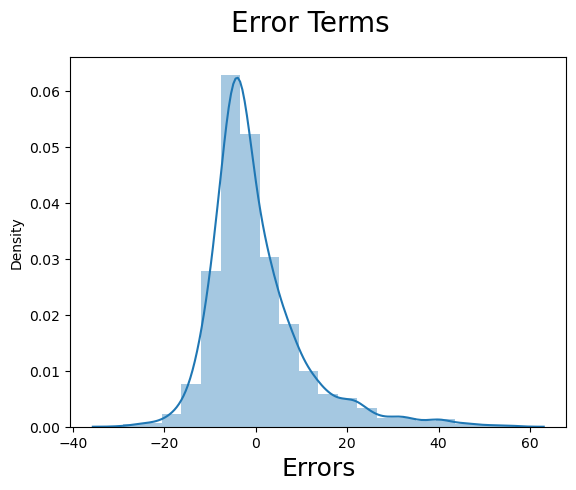

In [172]:
lm = sm.OLS(y_train,X_train_new).fit()
y_train_price = lm.predict(X_train_new)
fig = plt.figure()
sns.distplot((y_train - y_train_price), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)
plt.xlabel('Errors', fontsize = 18) 

Рпспределение остатков должно выглядеть нормальным. В данном случае, это хоть и похоже на нормальное распределение, но всё-таки оно скошено в сторону больших положительных ошибок.
Оценим качество модели на тестовых данных.

Text(0, 0.5, 'y_pred')

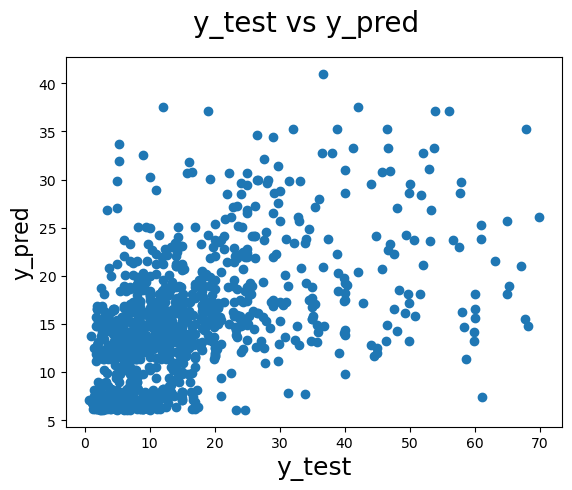

In [173]:
y_test = df_test['price']
X_test = df_test.drop("price", axis='columns')
X_train_new = X_train_new.drop('const',axis=1)
X_test_new = X_test[X_train_new.columns]
X_test_new = sm.add_constant(X_test_new)
y_pred = lm.predict(X_test_new)
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)            
plt.xlabel('y_test', fontsize=18)                         
plt.ylabel('y_pred', fontsize=16) 

Итак, можно заключить, что на цену всех товаров по категориям влияют габариты товара - то есть вес, что не удивительно. При этом большее воздействие оказывают принадлежность товара к категориям: хобби, игрушечные транспортные средства, игровые наборы, брендовые вещи. Таким образом, можно предположить, что цена различается по этим категориям товаров.

### Логистическая регрессия


#### Подготовка данных

Логистическая регрессия строится для 2 категорий данных. Чтобы смоделировать, как различаются эти категории. Попробуем посмотрить модель логистической регрессии (*или иной дискрминантной модели*), которая покажет различия между категориями Хобби и Игрушечные транспортные средства. 


Подготовим данные для этого: 

In [174]:
df_log = df[(df['category'] == 'Hobbies') | (df['category'] == 'Die-Cast & Toy Vehicles')]
df_log = df_log[['price', 'average_review_rating', 'category', 'customer_review', 'Item_Weight', 'number_in_stock',
            'number_of_reviews','Product_Dimensions_X','Product_Dimensions_Y','Product_Dimensions_Z']]

df_log = df_log.dropna()
df_log = df_log[df_log['Item_Weight'] < 1600]
df_log = df_log[df_log['number_in_stock'] < 26]
df_log = df_log[df_log['number_of_reviews'] < 36]
df_log = df_log[df_log['Product_Dimensions_X'] < 52.1]
df_log = df_log[df_log['Product_Dimensions_Y'] < 34.36]
df_log = df_log[df_log['Product_Dimensions_Z'] < 37]
df_log = df_log[df_log['price'] > 0]
df_log.describe()

,price,average_review_rating,customer_review,Item_Weight,number_in_stock,number_of_reviews,Product_Dimensions_X,Product_Dimensions_Y,Product_Dimensions_Z
count,1216.000000,1216.000000,1216.000000,1216.000000,1216.000000,1216.000000,1216.000000,1216.000000,1216.000000
mean,25.721283,4.755674,4.714638,280.781250,7.337171,3.259868,19.196053,10.740461,7.777632
std,34.510395,0.369541,0.625901,302.339049,5.690492,4.727460,10.221612,6.765385,6.074366
min,1.000000,3.300000,1.000000,5.000000,1.000000,1.000000,0.100000,0.100000,0.100000
25%,8.480000,4.500000,5.000000,59.000000,3.000000,1.000000,11.000000,5.100000,3.775000
50%,15.470000,5.000000,5.000000,181.000000,5.000000,1.000000,17.800000,10.200000,6.100000
75%,28.637500,5.000000,5.000000,390.000000,10.000000,3.000000,25.400000,15.000000,10.200000
max,439.950000,5.000000,5.000000,1500.000000,25.000000,35.000000,52.000000,34.300000,35.600000


#### Кореллограмма 


Посмотрим на корреляции наших количественных переменных. 
Здесь можно выделить, что в целом корреляция между переменными слабая, но она есть среди показателей размерности, а так же цены с весом. Кроме того есть положительная корреляция средней оценки товара с оценкой покупателя конкретного товара. Таким образом, можно сказать, что в данных категориях покупатели в итоге оценивают товар в соответствии со своими ожиданиями. Что противоречит общим данным, где количество оценок и оценка конкретного покупателя отрицательно коррелируют.

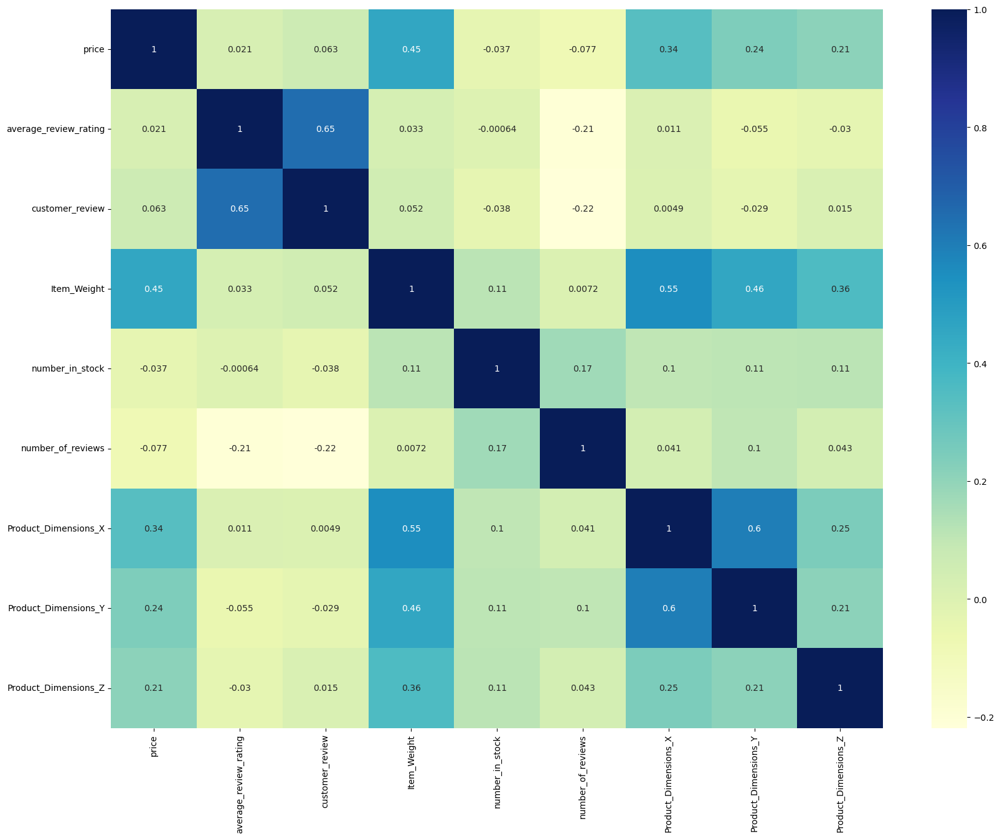

In [175]:
plt.figure(figsize = (20, 15))
sns.heatmap(df_log.corr(), annot = True, cmap="YlGnBu")
plt.show()

#### Выбор оптимальных переменных


Чтобы построить логистическую модель, нужна двумерная плоскость, т.е. 2 переменные, в плоскости которых будет происходить разделение. Здесь мы примем, что вес - в большей степени отвечает за размерность и возьмем его в качестве одной оси, а цена - в качестве другой оси. 
Оценки не берутся, потому что обладают маленькой размерностью, что плохо скажется на модели.

In [176]:
y_log = df_log['category']
y_log = y_log.replace('Die-Cast & Toy Vehicles', 1)
y_log = y_log.replace('Hobbies', 0)
y_log = np.array(y_log)
X_log = df_log[['price', 'Item_Weight']]
X_log =  np.array(X_log)
print(X_log.shape)
print(y_log.shape)

(1216, 2)
(1216,)


#### Построение модели


Построим сразу несколько моделей дискриминации категорий, используя пакет mlxtend, который нужно предварительно установить, используя в cmd:


```
pip install git+git://github.com/rasbt/mlxtend.git#egg=mlxtend
```


#### Оценка качества модели

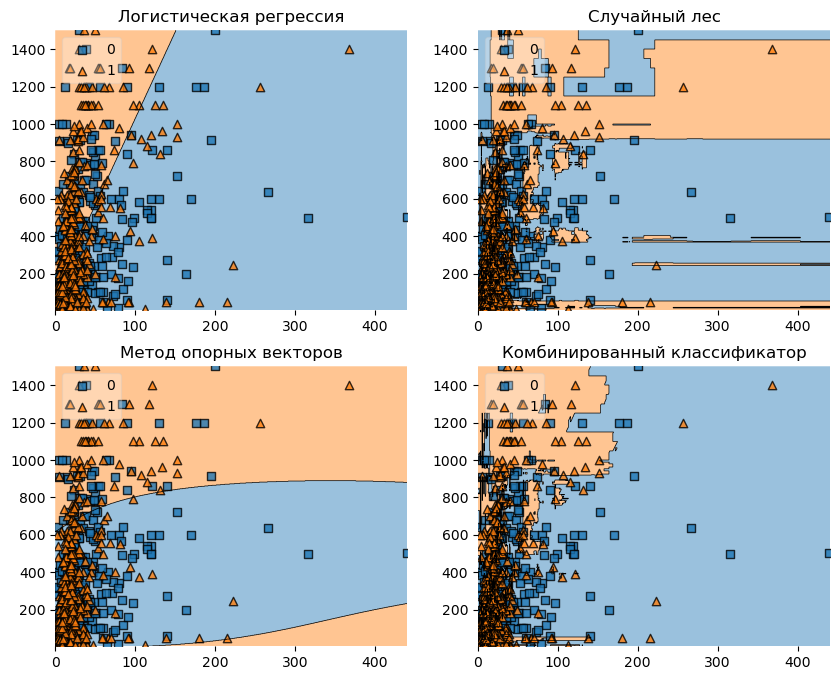

In [178]:
from mlxtend.plotting import plot_decision_regions
from mlxtend.classifier import LogisticRegression
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import itertools
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from mlxtend.classifier import EnsembleVoteClassifier
from mlxtend.data import iris_data
from mlxtend.plotting import plot_decision_regions


clf1 = LogisticRegression(random_state=0)
clf2 = RandomForestClassifier(random_state=0)
clf3 = SVC(random_state=0, probability=True)
eclf = EnsembleVoteClassifier(clfs=[clf1, clf2, clf3],
                              weights=[2, 1, 1], voting='soft')


y_log = df_log['category']
y_log = y_log.replace('Die-Cast & Toy Vehicles', 1)
y_log = y_log.replace('Hobbies', 0)
y_log = np.array(y_log)
X_log = df_log[['price', 'Item_Weight']]
X_log =  np.array(X_log)



gs = gridspec.GridSpec(2, 2)
fig = plt.figure(figsize=(10, 8))

labels = ['Логистическая регрессия',
          'Случайный лес',
          'Метод опорных векторов',
          'Комбинированный классификатор']

for clf, lab, grd in zip([clf1, clf2, clf3, eclf],
                         labels,
                         itertools.product([0, 1],
                         repeat=2)):
    clf.fit(X_log, y_log)
    ax = plt.subplot(gs[grd[0], grd[1]])
    fig = plot_decision_regions(X=X_log, y=y_log,
                                clf=clf, legend=2)
    plt.title(lab)

plt.show()

Как можно заметить, все модели плохо разделяют данные. Таким образом, нельзя провести черты между категориями Хобби и Игрушечный транспорт по цене и весу товаров стоимостью до 500 евро.

### Выводы


___
В ходе анализа датасета о данных электронной коммерции на амазон мы выяснили, что среди всех категорий товаров наблюдается отрицательная корреляция между количеством отзывов и рейтингом товара. Наоборот, среди категорий Хобби и Игрушечный транспорт корреляция была положительной между отзывами покупателей и средним отзывом от товаре.


Мы выявили, что подкатегория и тип продукта связаны между собой. Средня цена по категориям игрушки и игрушечный транспорт отличается, средний рейтинг всех товаров значимо отличается от 5 и средние оценки товара и оценки покупателей так же значимо отличаются. 


Кроме того, было выяснено, что на цену товара влияет вес и его категория путем оценки линейной регрессии. 


В целом, данные обладают большим потенциалом в области анализа предпочтений потребителей, поскольку имеют большой набор данных по разным параметрам и текстовые описания товаров.

In [139]:
%%javascript
$.getScript('https://kmahelona.github.io/ipython_notebook_goodies/ipython_notebook_toc.js')

<IPython.core.display.Javascript object>